🛰️  Loading LISS-IV bands...
✅ Image dimensions: 16091 x 18457


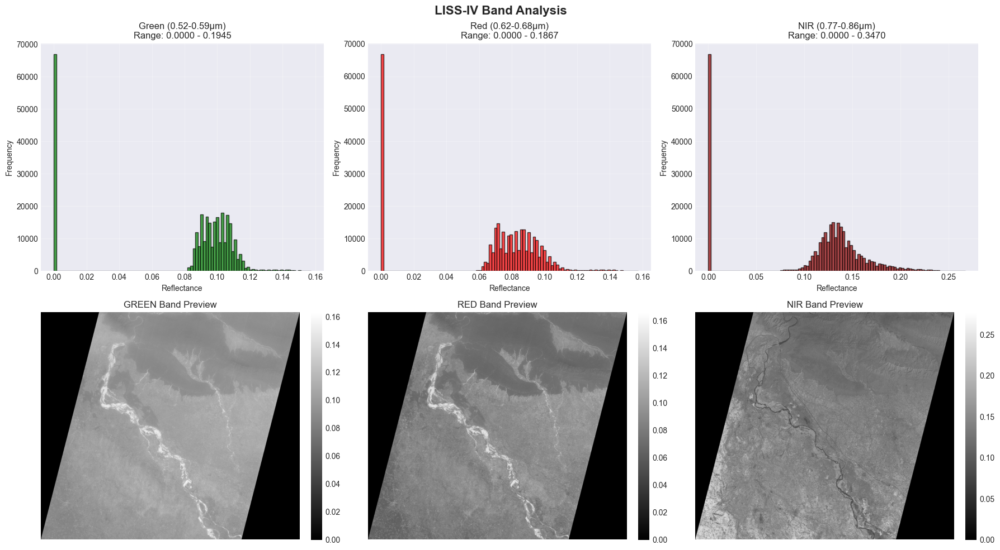

🎯 ROI set: x(4100-13800), y(400-15000)
📐 ROI dimensions: 14600 x 9700


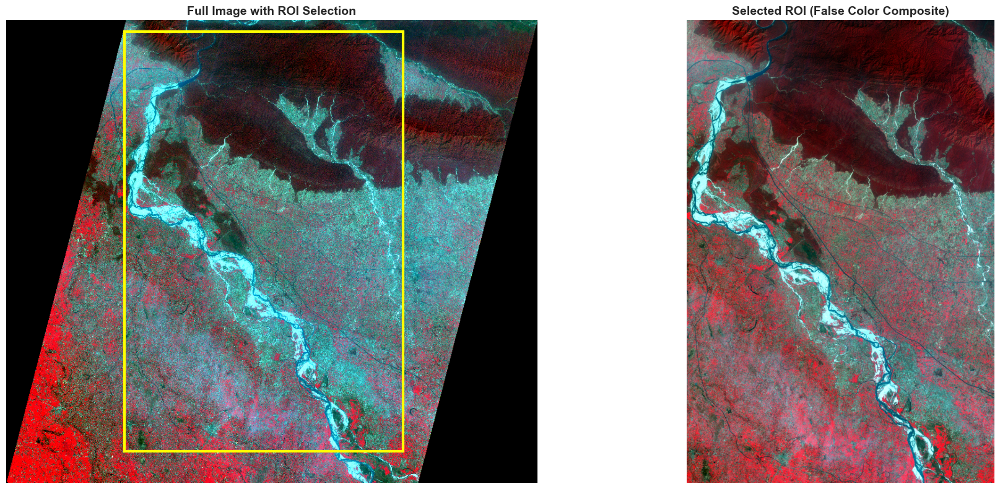

🔄 Processing 4x5 tiles...


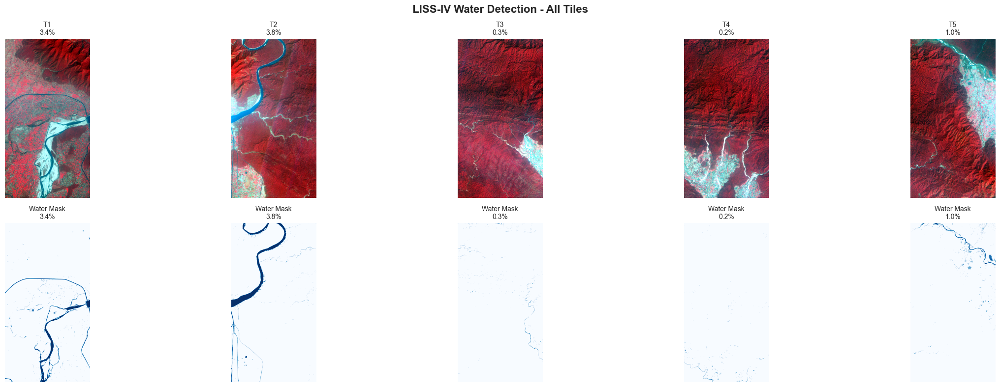

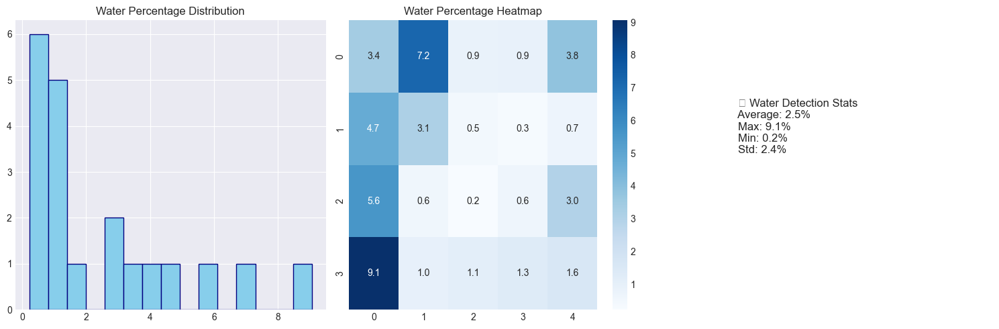

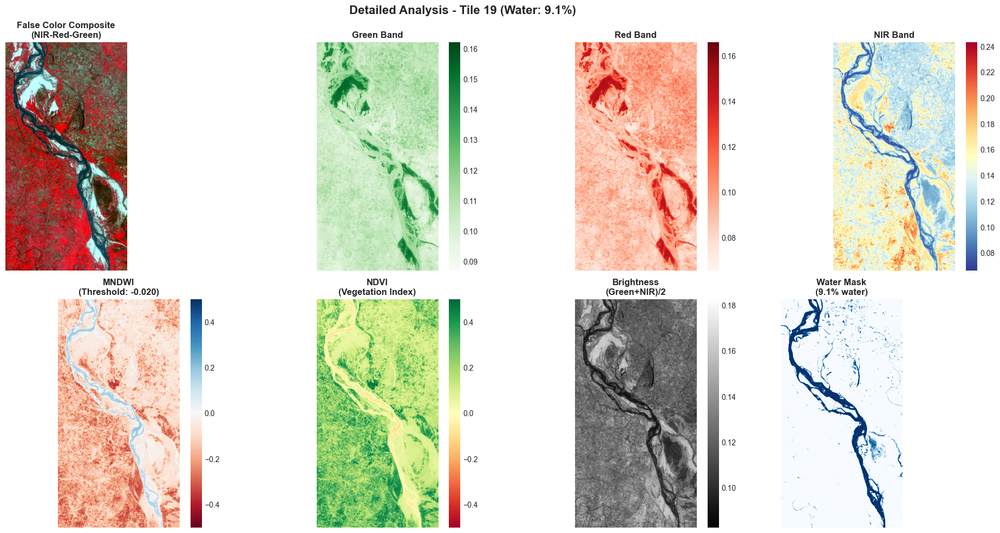

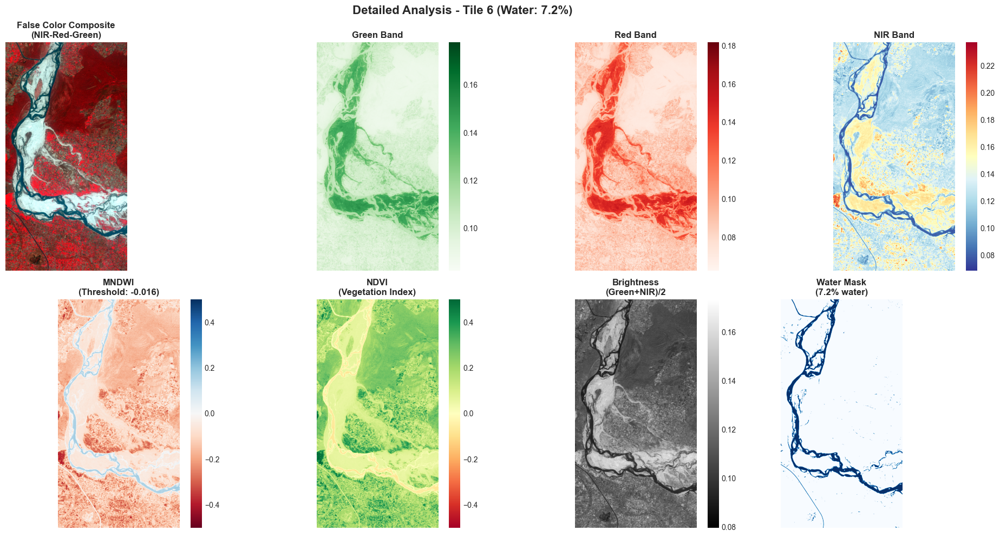

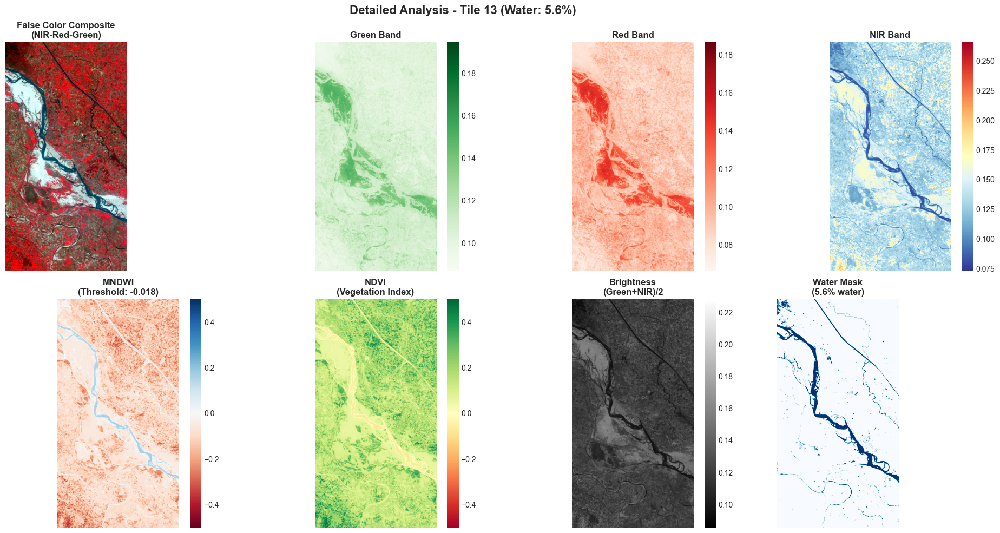


🌊 LISS-IV WATER DETECTION COMPREHENSIVE REPORT

📊 OVERALL STATISTICS:
   • Total tiles analyzed: 20
   • Average water coverage: 2.48%
   • Maximum water coverage: 9.06%
   • Minimum water coverage: 0.22%
   • Standard deviation: 2.45%

🏷️  WATER CONTENT CLASSIFICATION:
   • High water content (>20%): 0 tiles
   • Medium water content (10-20%): 0 tiles
   • Low water content (5-10%): 3 tiles
   • Minimal water content (<5%): 17 tiles

🏆 TOP 10 WATER-RICH TILES:
    1. Tile 19:   9.06% at coordinates (9920, 11350) to (11860, 15000)
    2. Tile  6:   7.23% at coordinates (4100, 4050) to (6040, 7700)
    3. Tile 13:   5.60% at coordinates (7980, 7700) to (9920, 11350)
    4. Tile  7:   4.75% at coordinates (6040, 4050) to (7980, 7700)
    5. Tile  2:   3.83% at coordinates (6040, 400) to (7980, 4050)
    6. Tile  1:   3.37% at coordinates (4100, 400) to (6040, 4050)
    7. Tile 12:   3.14% at coordinates (6040, 7700) to (7980, 11350)
    8. Tile 14:   3.01% at coordinates (9920, 7700) to

In [8]:

    import rasterio
    import numpy as np
    from skimage.morphology import remove_small_objects
    import matplotlib.pyplot as plt
    import matplotlib.patches as patches
    from matplotlib.gridspec import GridSpec
    import seaborn as sns
    from skimage.filters import threshold_otsu
    from scipy import ndimage
    import warnings
    warnings.filterwarnings('ignore')

    # Set style for better visuals
    plt.style.use('seaborn-v0_8-darkgrid')
    sns.set_palette("husl")

    class LISS4WaterDetector:
        def __init__(self):
            self.bands = {}
            self.roi_coords = None
            self.tile_results = []
            
        def load_liss4_band(self, path):
            """Load and properly scale LISS-IV band (10-bit or 12-bit)"""
            with rasterio.open(path) as src:
                band = src.read(1)
                # Check if data is 10-bit (0-1023) or 12-bit (0-4095)
                max_val = 1023 if band.max() <= 1023 else 4095
                return band.astype('float32') / max_val
        
        def load_bands(self, green_path, red_path, nir_path):
            """Load all spectral bands"""
            print("🛰️  Loading LISS-IV bands...")
            self.bands['green'] = self.load_liss4_band(green_path)
            self.bands['red'] = self.load_liss4_band(red_path)
            self.bands['nir'] = self.load_liss4_band(nir_path)
            
            full_height, full_width = self.bands['green'].shape
            print(f"✅ Image dimensions: {full_height} x {full_width}")
            
            # Display band statistics
            self.visualize_band_stats()
            
        def visualize_band_stats(self):
            """Visualize band statistics and histograms"""
            fig, axes = plt.subplots(2, 3, figsize=(18, 10))
            fig.suptitle('LISS-IV Band Analysis', fontsize=16, fontweight='bold')
            
            colors = ['green', 'red', 'darkred']
            band_names = ['Green (0.52-0.59µm)', 'Red (0.62-0.68µm)', 'NIR (0.77-0.86µm)']
            
            for i, (band_key, band_data) in enumerate(self.bands.items()):
                # Histograms
                axes[0, i].hist(band_data.flatten()[::1000], bins=100, 
                            color=colors[i], alpha=0.7, edgecolor='black')
                axes[0, i].set_title(f'{band_names[i]}\nRange: {band_data.min():.4f} - {band_data.max():.4f}')
                axes[0, i].set_xlabel('Reflectance')
                axes[0, i].set_ylabel('Frequency')
                axes[0, i].grid(True, alpha=0.3)
                
                # Band display
                im = axes[1, i].imshow(band_data[::10, ::10], cmap='gray', aspect='auto')
                axes[1, i].set_title(f'{band_key.upper()} Band Preview')
                axes[1, i].axis('off')
                plt.colorbar(im, ax=axes[1, i], fraction=0.046, pad=0.04)
            
            plt.tight_layout()
            plt.show()
        
        def set_roi(self, x_start, x_end, y_start, y_end):
            """Set Region of Interest with validation"""
            full_height, full_width = self.bands['green'].shape
            
            # Validate and adjust coordinates
            x_start = max(0, min(x_start, full_width))
            x_end = max(x_start, min(x_end, full_width))
            y_start = max(0, min(y_start, full_height))
            y_end = max(y_start, min(y_end, full_height))
            
            self.roi_coords = (x_start, x_end, y_start, y_end)
            print(f"🎯 ROI set: x({x_start}-{x_end}), y({y_start}-{y_end})")
            
            # Extract ROI from all bands
            band_keys = list(self.bands.keys())  # Create a copy of keys to avoid runtime error
            for band_key in band_keys:
                self.bands[f'{band_key}_roi'] = self.bands[band_key][y_start:y_end, x_start:x_end]
            
            roi_height, roi_width = self.bands['green_roi'].shape
            print(f"📐 ROI dimensions: {roi_height} x {roi_width}")
            
            # Visualize ROI selection
            self.visualize_roi_selection()
        
        def visualize_roi_selection(self):
            """Visualize the selected ROI on the full image"""
            fig, axes = plt.subplots(1, 2, figsize=(20, 8))
            
            # Full image with ROI overlay
            fcc_full = self.create_fcc(self.bands['nir'], self.bands['red'], self.bands['green'])
            axes[0].imshow(fcc_full[::20, ::20])  # Downsample for display
            
            # Add ROI rectangle
            x_start, x_end, y_start, y_end = self.roi_coords
            rect = patches.Rectangle((x_start//20, y_start//20), 
                                (x_end-x_start)//20, (y_end-y_start)//20,
                                linewidth=3, edgecolor='yellow', facecolor='none')
            axes[0].add_patch(rect)
            axes[0].set_title('Full Image with ROI Selection', fontsize=14, fontweight='bold')
            axes[0].axis('off')
            
            # ROI close-up
            fcc_roi = self.create_fcc(self.bands['nir_roi'], self.bands['red_roi'], self.bands['green_roi'])
            axes[1].imshow(fcc_roi[::5, ::5])  # Less downsampling for ROI
            axes[1].set_title('Selected ROI (False Color Composite)', fontsize=14, fontweight='bold')
            axes[1].axis('off')
            
            plt.tight_layout()
            plt.show()
        
        def create_fcc(self, nir, red, green):
            """Create False Color Composite (NIR-Red-Green)"""
            return np.dstack((
                self.scale_for_display(nir),
                self.scale_for_display(red),
                self.scale_for_display(green)
            ))
        
        def scale_for_display(self, img, percentile=98):
            """Enhanced contrast stretching for visualization"""
            img = np.nan_to_num(img, nan=0.0)
            valid_pixels = img[img > 0]
            if len(valid_pixels) > 0:
                p2, p98 = np.percentile(valid_pixels, (2, percentile))
                return np.clip((img - p2) / (p98 - p2), 0, 1)
            return img
        
        def enhanced_water_detection(self, green_tile, nir_tile, red_tile=None, min_size=50):
            """
            Optimized water detection for LISS-IV with multiple indices
            """
            # Calculate water indices
            mndwi = (green_tile - nir_tile) / (green_tile + nir_tile + 1e-10)
            
            # Also calculate NDWI for comparison
            if red_tile is not None:
                ndwi = (green_tile - red_tile) / (green_tile + red_tile + 1e-10)
                ndvi = (nir_tile - red_tile) / (nir_tile + red_tile + 1e-10)
            else:
                ndwi = np.zeros_like(mndwi)
                ndvi = np.zeros_like(mndwi)
            
            # Dynamic thresholding
            try:
                thresh_mndwi = threshold_otsu(mndwi[(mndwi > -1) & (mndwi < 1)]) * 0.15
            except:
                thresh_mndwi = 0.05
            
            # Brightness filter
            brightness = (green_tile + nir_tile) / 2
            brightness_thresh = 0.12
            
            # Create water masks using different methods
            water_mask_mndwi = (mndwi > thresh_mndwi) & (brightness < brightness_thresh)
            
            if red_tile is not None:
                # Exclude vegetation
                water_mask_mndwi = water_mask_mndwi & (ndvi < 0.2)
            
            # Remove small objects
            water_mask_final = remove_small_objects(water_mask_mndwi, min_size=min_size)
            
            return {
                'water_mask': water_mask_final,
                'mndwi': mndwi,
                'ndwi': ndwi,
                'ndvi': ndvi,
                'brightness': brightness,
                'threshold': thresh_mndwi
            }
        
        def process_tiles(self, rows=4, cols=5, min_size=10):
            """Process ROI in tiles with comprehensive analysis"""
            print(f"🔄 Processing {rows}x{cols} tiles...")
            
            roi_height, roi_width = self.bands['green_roi'].shape
            tile_height = roi_height // rows
            tile_width = roi_width // cols
            
            self.tile_results = []
            water_percentages = []
            
            # Create figure for all tiles in one row
            fig, axes = plt.subplots(2, cols, figsize=(25, 8))
            fig.suptitle('LISS-IV Water Detection - All Tiles', fontsize=16, fontweight='bold')
            
            for j in range(cols):
                for i in range(rows):
                    tile_idx = i * cols + j + 1
                    
                    # Extract tile
                    y1, y2 = i * tile_height, (i + 1) * tile_height
                    x1, x2 = j * tile_width, (j + 1) * tile_width
                    
                    green_tile = self.bands['green_roi'][y1:y2, x1:x2]
                    red_tile = self.bands['red_roi'][y1:y2, x1:x2]
                    nir_tile = self.bands['nir_roi'][y1:y2, x1:x2]
                    
                    # Detect water
                    results = self.enhanced_water_detection(green_tile, nir_tile, red_tile, min_size)
                    water_pct = np.sum(results['water_mask']) / results['water_mask'].size * 100
                    water_percentages.append(water_pct)
                    
                    # Store results
                    x_start, x_end, y_start, y_end = self.roi_coords
                    self.tile_results.append({
                        'tile': tile_idx,
                        'water_pct': water_pct,
                        'coords': (x_start + x1, y_start + y1, x_start + x2, y_start + y2),
                        'results': results,
                        'row': i,
                        'col': j
                    })
                    
                    # Only plot one column per tile position (since we're doing single row)
                    if i == 0:
                        # Original FCC
                        fcc = self.create_fcc(nir_tile, red_tile, green_tile)
                        axes[0, j].imshow(fcc)
                        axes[0, j].set_title(f'T{tile_idx}\n{water_pct:.1f}%', fontsize=10)
                        axes[0, j].axis('off')
                        
                        # Water mask
                        axes[1, j].imshow(results['water_mask'], cmap='Blues')
                        axes[1, j].set_title(f'Water Mask\n{water_pct:.1f}%', fontsize=10)
                        axes[1, j].axis('off')
            
            plt.tight_layout()
            plt.show()
            
            # Create summary statistics figure
            self.create_summary_figure(water_percentages, rows, cols)
            
            # Create detailed analysis for top water tiles
            self.create_detailed_analysis()
            
            return self.tile_results
            
        def create_summary_figure(self, water_percentages, rows, cols):
            """Create separate figure for summary statistics"""
            fig = plt.figure(figsize=(15, 5))
            gs = GridSpec(1, 3, figure=fig)
            
            # Histogram
            ax_hist = fig.add_subplot(gs[0, 0])
            ax_hist.hist(water_percentages, bins=15, color='skyblue', edgecolor='navy')
            ax_hist.set_title('Water Percentage Distribution')
            
            # Heatmap
            ax_heatmap = fig.add_subplot(gs[0, 1])
            water_grid = np.array(water_percentages).reshape(rows, cols)
            sns.heatmap(water_grid, annot=True, fmt=".1f", cmap="Blues", ax=ax_heatmap)
            ax_heatmap.set_title('Water Percentage Heatmap')
            
            # Stats
            ax_stats = fig.add_subplot(gs[0, 2])
            ax_stats.axis('off')
            stats_text = f"""
            📊 Water Detection Stats
            Average: {np.mean(water_percentages):.1f}%
            Max: {np.max(water_percentages):.1f}%
            Min: {np.min(water_percentages):.1f}%
            Std: {np.std(water_percentages):.1f}%
            """
            ax_stats.text(0.1, 0.5, stats_text, fontsize=12)
            
            plt.tight_layout()
            plt.show()   
        
        def add_summary_plots(self, fig, gs, rows, cols, water_percentages):
            """Add summary statistics and visualizations"""
            # Water percentage histogram
            ax_hist = fig.add_subplot(gs[rows, :cols//2])
            ax_hist.hist(water_percentages, bins=15, color='skyblue', 
                        edgecolor='navy', alpha=0.7)
            ax_hist.set_title('Water Percentage Distribution', fontweight='bold')
            ax_hist.set_xlabel('Water Percentage (%)')
            ax_hist.set_ylabel('Number of Tiles')
            ax_hist.grid(True, alpha=0.3)
            
            # Water percentage heatmap
            ax_heatmap = fig.add_subplot(gs[rows, cols//2:cols])
            water_grid = np.array(water_percentages).reshape(rows, cols)
            im = ax_heatmap.imshow(water_grid, cmap='Blues', aspect='auto')
            ax_heatmap.set_title('Water Distribution Heatmap', fontweight='bold')
            
            # Add percentage labels
            for i in range(rows):
                for j in range(cols):
                    ax_heatmap.text(j, i, f'{water_grid[i, j]:.1f}%', 
                                ha='center', va='center', fontweight='bold')
            
            plt.colorbar(im, ax=ax_heatmap, fraction=0.046, pad=0.04)
            
            # Statistics text
            ax_stats = fig.add_subplot(gs[rows+1, :])
            stats_text = f"""
            📊 WATER DETECTION STATISTICS
            Average Water Coverage: {np.mean(water_percentages):.2f}%
            Maximum Water Coverage: {np.max(water_percentages):.2f}%
            Minimum Water Coverage: {np.min(water_percentages):.2f}%
            Standard Deviation: {np.std(water_percentages):.2f}%
            Tiles with >10% water: {sum(1 for x in water_percentages if x > 10)} / {len(water_percentages)}
            """
            ax_stats.text(0.5, 0.5, stats_text, transform=ax_stats.transAxes,
                        fontsize=12, ha='center', va='center',
                        bbox=dict(boxstyle="round,pad=0.5", facecolor="lightblue", alpha=0.8))
            ax_stats.axis('off')
        
        def create_detailed_analysis(self, top_n=3):
            """Create detailed analysis for top water-containing tiles"""
            # Sort tiles by water percentage
            sorted_tiles = sorted(self.tile_results, key=lambda x: x['water_pct'], reverse=True)
            
            for idx, tile_data in enumerate(sorted_tiles[:top_n]):
                tile_num = tile_data['tile']
                water_pct = tile_data['water_pct']
                results = tile_data['results']
                row, col = tile_data['row'], tile_data['col']
                
                # Extract tile data
                roi_height, roi_width = self.bands['green_roi'].shape
                rows, cols = 4, 5  # Default grid
                tile_height = roi_height // rows
                tile_width = roi_width // cols
                
                y1, y2 = row * tile_height, (row + 1) * tile_height
                x1, x2 = col * tile_width, (col + 1) * tile_width
                
                green_tile = self.bands['green_roi'][y1:y2, x1:x2]
                red_tile = self.bands['red_roi'][y1:y2, x1:x2]
                nir_tile = self.bands['nir_roi'][y1:y2, x1:x2]
                
                # Create detailed visualization
                fig, axes = plt.subplots(2, 4, figsize=(20, 10))
                fig.suptitle(f'Detailed Analysis - Tile {tile_num} (Water: {water_pct:.1f}%)', 
                            fontsize=16, fontweight='bold')
                
                # False Color Composite
                fcc = self.create_fcc(nir_tile, red_tile, green_tile)
                axes[0, 0].imshow(fcc)
                axes[0, 0].set_title('False Color Composite\n(NIR-Red-Green)', fontweight='bold')
                axes[0, 0].axis('off')
                
                # Individual bands
                im1 = axes[0, 1].imshow(green_tile, cmap='Greens')
                axes[0, 1].set_title('Green Band', fontweight='bold')
                axes[0, 1].axis('off')
                plt.colorbar(im1, ax=axes[0, 1], fraction=0.046, pad=0.04)
                
                im2 = axes[0, 2].imshow(red_tile, cmap='Reds')
                axes[0, 2].set_title('Red Band', fontweight='bold')
                axes[0, 2].axis('off')
                plt.colorbar(im2, ax=axes[0, 2], fraction=0.046, pad=0.04)
                
                im3 = axes[0, 3].imshow(nir_tile, cmap='RdYlBu_r')
                axes[0, 3].set_title('NIR Band', fontweight='bold')
                axes[0, 3].axis('off')
                plt.colorbar(im3, ax=axes[0, 3], fraction=0.046, pad=0.04)
                
                # Water indices
                im4 = axes[1, 0].imshow(results['mndwi'], cmap='RdBu', vmin=-0.5, vmax=0.5)
                axes[1, 0].set_title(f'MNDWI\n(Threshold: {results["threshold"]:.3f})', fontweight='bold')
                axes[1, 0].axis('off')
                plt.colorbar(im4, ax=axes[1, 0], fraction=0.046, pad=0.04)
                
                im5 = axes[1, 1].imshow(results['ndvi'], cmap='RdYlGn', vmin=-0.5, vmax=0.5)
                axes[1, 1].set_title('NDVI\n(Vegetation Index)', fontweight='bold')
                axes[1, 1].axis('off')
                plt.colorbar(im5, ax=axes[1, 1], fraction=0.046, pad=0.04)
                
                im6 = axes[1, 2].imshow(results['brightness'], cmap='gray')
                axes[1, 2].set_title('Brightness\n(Green+NIR)/2', fontweight='bold')
                axes[1, 2].axis('off')
                plt.colorbar(im6, ax=axes[1, 2], fraction=0.046, pad=0.04)
                
                # Final water mask
                axes[1, 3].imshow(results['water_mask'], cmap='Blues')
                axes[1, 3].set_title(f'Water Mask\n({water_pct:.1f}% water)', fontweight='bold')
                axes[1, 3].axis('off')
                
                plt.tight_layout()
                plt.show()
        
        def generate_report(self):
            """Generate a comprehensive analysis report"""
            if not self.tile_results:
                print("❌ No tile results available. Run process_tiles() first.")
                return
            
            water_percentages = [tile['water_pct'] for tile in self.tile_results]
            sorted_tiles = sorted(self.tile_results, key=lambda x: x['water_pct'], reverse=True)
            
            print("\n" + "="*80)
            print("🌊 LISS-IV WATER DETECTION COMPREHENSIVE REPORT")
            print("="*80)
            
            print(f"\n📊 OVERALL STATISTICS:")
            print(f"   • Total tiles analyzed: {len(self.tile_results)}")
            print(f"   • Average water coverage: {np.mean(water_percentages):.2f}%")
            print(f"   • Maximum water coverage: {np.max(water_percentages):.2f}%")
            print(f"   • Minimum water coverage: {np.min(water_percentages):.2f}%")
            print(f"   • Standard deviation: {np.std(water_percentages):.2f}%")
            
            # Classification
            high_water = sum(1 for x in water_percentages if x > 20)
            medium_water = sum(1 for x in water_percentages if 10 < x <= 20)
            low_water = sum(1 for x in water_percentages if 5 < x <= 10)
            minimal_water = sum(1 for x in water_percentages if x <= 5)
            
            print(f"\n🏷️  WATER CONTENT CLASSIFICATION:")
            print(f"   • High water content (>20%): {high_water} tiles")
            print(f"   • Medium water content (10-20%): {medium_water} tiles")
            print(f"   • Low water content (5-10%): {low_water} tiles")
            print(f"   • Minimal water content (<5%): {minimal_water} tiles")
            
            print(f"\n🏆 TOP 10 WATER-RICH TILES:")
            for i, tile in enumerate(sorted_tiles[:10], 1):
                coords = tile['coords']
                print(f"   {i:2d}. Tile {tile['tile']:2d}: {tile['water_pct']:6.2f}% "
                    f"at coordinates ({coords[0]}, {coords[1]}) to ({coords[2]}, {coords[3]})")
            
            print("\n" + "="*80)

    # Example usage
    def main():
        # Initialize detector
        detector = LISS4WaterDetector()
        
        # Load bands
        detector.load_bands('BAND2.tif', 'BAND3.tif', 'BAND4.tif')
        
        # Set ROI
        detector.set_roi(4100, 13800, 400, 15000)
        
        # Process tiles
        results = detector.process_tiles(rows=4, cols=5)
        
        # Generate comprehensive report
        detector.generate_report()

    if __name__ == "__main__":
        main()